### Notebook Setup

Sources:
-GeoJson for KT area: https://github.com/missinglink/uk-postcode-polygons

In [1]:
#Import libraries

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import numpy as np

import json
import requests # library to handle requests
from requests import get
import re # Regular expression
import ast

import matplotlib.pyplot as plt
import seaborn as sns

from itertools import islice
from geopy.geocoders import Nominatim

import folium # map rendering library

# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

from bs4 import BeautifulSoup

# import k-means from clustering stage
from sklearn.cluster import KMeans

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

In [2]:
#pd.set_option('display.max_colwidth', None, 'display.max_rows', None)

In [3]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"

___

### 1. Scrape data from online

In [4]:
#1.#https://www.rightmove.co.uk/property-for-sale/find.html?locationIdentifier=REGION%5E972&maxBedrooms=5&maxPrice=800000&minPrice=350000&index=24&propertyTypes=&includeSSTC=false&mustHave=&dontShow=newHome%2CsharedOwnership%2Cretirement&furnishTypes=&keywords=

#2#https://www.rightmove.co.uk/property-for-sale/find.html?locationIdentifier=REGION%5E94441&maxPrice=1000000&minPrice=300000&index=24&propertyTypes=detached%2Cflat%2Csemi-detached%2Cterraced&secondaryDisplayPropertyType=housesandflats&includeSSTC=false&mustHave=&dontShow=retirement&furnishTypes=&keywords=

#KT area: https://en.wikipedia.org/wiki/KT_postcode_area

all_data = pd.DataFrame([])

base_url= ("https://www.rightmove.co.uk/property-for-sale/find.html?locationIdentifier=REGION%5E94441&maxPrice=1000000&minPrice=300000&index=24&propertyTypes=detached%2Cflat%2Csemi-detached%2Cterraced&secondaryDisplayPropertyType=housesandflats&includeSSTC=false&mustHave=&dontShow=retirement&furnishTypes=&keywords=")

results = requests.get(base_url).text
soup = BeautifulSoup(results, "html.parser")

find = soup.find_all("script")

reg = r"window.jsonModel\s+=\s+(\{.*?\</script>)"

pattern = re.compile(reg)
match = pattern.findall(str(find))

match_strip = match[0].rstrip("</script>")

s1 = json.dumps(match_strip)
json_data = json.loads(s1) 

s3 = json.loads(str(json_data))

pagination =  s3.get("pagination").get("options")

pagination = pd.DataFrame(pagination)



for value in islice(pagination.iloc[:,0],0,42):
    print(value)

    iter_url = "https://www.rightmove.co.uk/property-for-sale/find.html?locationIdentifier=REGION%5E94441&maxPrice=1000000&minPrice=300000&index={}&propertyTypes=detached%2Cflat%2Csemi-detached%2Cterraced&secondaryDisplayPropertyType=housesandflats&includeSSTC=false&mustHave=&dontShow=retirement&furnishTypes=&keywords=".format(value)
    
   
   
    results = requests.get(iter_url).text
    soup = BeautifulSoup(results, "html.parser")
    
    find = soup.find_all("script")
    
    reg = r"window.jsonModel\s+=\s+(\{.*?\</script>)"

    pattern = re.compile(reg)
    match = pattern.findall(str(find))

    match_strip = match[0].rstrip("</script>")

    s1 = json.dumps(match_strip)
    json_data = json.loads(s1) 

    s3 = json.loads(str(json_data))
    
    list_properties =  s3.get("properties")
    
    df = pd.DataFrame(list_properties)
    df.drop(["propertyImages"], axis=1, inplace=True)

    all_data = all_data.append(df, ignore_index=True)
    
    
    
    
#pd.set_option("display.max_rows", df.shape[0]+1)


all_data.shape
all_data

0
24
48
72
96
120
144
168
192
216
240
264
288
312
336
360
384
408
432
456
480
504
528
552
576
600
624
648
672
696
720
744
768
792
816
840
864
888
912
936
960
984


,id,bedrooms,bathrooms,numberOfImages,numberOfFloorplans,numberOfVirtualTours,summary,displayAddress,countryCode,location,propertySubType,listingUpdate,premiumListing,featuredProperty,price,customer,distance,transactionType,productLabel,commercial,development,residential,students,auction,feesApply,feesApplyText,displaySize,showOnMap,propertyUrl,contactUrl,staticMapUrl,channel,firstVisibleDate,keywords,keywordMatchType,saved,hidden,onlineViewingsAvailable,heading,enhancedListing,displayStatus,formattedBranchName,addedOrReduced,isRecent,formattedDistance,hasBrandPlus,propertyTypeFullDescription
0,89682484,3,2.0,20,1,1,Tucked away at the head of a popular cul de sa...,"Galen Close, Epsom",GB,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,True,"{'amount': 485000, 'frequency': 'not specified...","{'branchId': 10255, 'brandPlusLogoURI': '/11k/...",None,buy,"{'productLabelText': 'Video Tour', 'spotlightL...",False,False,True,False,False,False,None,,True,/properties/89682484,/property-for-sale/contactBranch.html?property...,None,BUY,2021-03-10T09:32:09Z,[],no_keyword,False,False,False,Featured Property,False,,"by The Personal Agent, Epsom",Added on 10/03/2021,False,,True,3 bedroom end of terrace house for sale
1,102490706,4,2.0,18,1,1,Seymours of Surbiton are delighted to offer to...,"Berrylands, Surbiton",GB,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 169772, 'brandPlusLogoURI': '/170...",None,buy,"{'productLabelText': 'Video Tour', 'spotlightL...",False,False,True,False,False,False,None,,True,/properties/102490706,/property-for-sale/contactBranch.html?property...,None,BUY,2021-02-04T17:05:41Z,[],no_keyword,False,False,False,,False,,"by Seymours, South West London",Added on 04/02/2021,False,,True,4 bedroom semi-detached house for sale
2,72967107,2,2.0,7,1,0,Luxury apartment in private gated development.,"Milbourne House, Princess Square, Esher, Surre...",GB,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'listingUpdateReason': 'price_reduced', 'list...",False,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 48572, 'brandPlusLogoURI': '/comp...",None,buy,"{'productLabelText': '', 'spotlightLabel': False}",False,True,True,False,False,False,None,,True,/properties/72967107,/property-for-sale/contactBranch.html?property...,None,BUY,2020-09-03T18:43:02Z,[],no_keyword,False,False,True,,False,,"by Savills, Esher",Reduced on 09/01/2021,False,,True,2 bedroom penthouse for sale
3,103308818,4,0.0,15,1,0,"TASTEFULLY PRESENTED THROUGHOUT, AN ATTRACTIVE...","Woodham, KT15",GB,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 17780, 'brandPlusLogoURI': '/bran...",None,buy,"{'productLabelText': 'Premium Listing', 'spotl...",False,False,True,False,False,False,None,,True,/properties/103308818,/property-for-sale/contactBranch.html?property...,None,BUY,2021-02-24T14:51:28Z,[],no_keyword,False,False,False,,False,,"by Seymours, West Byfleet",Added on 24/02/2021,False,,True,4 bedroom detached house for sale
4,86336218,6,NaN,14,1,0,A detached six bedroom family home for sale in...,"The Park, Great Bookham, Leatherhead, Surrey, ...",GB,"{'latitude': 51.281321, 'longitude': -0.376758}",Detached,"{'listingUpdateReason': 'price_reduced', 'list...",False,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 52766, 'brandPlusLogoURI': '/comp...",None,buy,"{'productLabelText': '', 'spotlightLabel': False}",False,False,True,False,False,False,None,,True,/properties/86336218,/property-for-sale/contactBranch.html?property...,None,BUY,2020-11-02T13:16:17Z,[],no_keyword,False,False,False,,False,,"by Knight Frank, Cobham",Reduced on 12/02/2021,False,,True,6 bedroom 

In [5]:
s3.get("properties")

[{'id': 78620355,
  'bedrooms': 3,
  'bathrooms': 1,
  'numberOfImages': 12,
  'numberOfFloorplans': 1,
  'numberOfVirtualTours': 0,
  'summary': 'A modern three-bedroom detached home with off-street parking, garage and home office studio. Ideally positioned within a cul-de-sac just moments from Walton-On-Thames Train Station. Internally this is a great home offering good accommodation and additional benefits such as a work from home o...',
  'displayAddress': 'Fisher Close, Walton-on-Thames',
  'countryCode': 'GB',
  'location': {'latitude': 51.37289, 'longitude': -0.410125},
  'propertySubType': 'Detached',
  'listingUpdate': {'listingUpdateReason': 'new',
   'listingUpdateDate': '2021-03-08T09:16:04Z'},
  'premiumListing': False,
  'featuredProperty': True,
  'price': {'amount': 560000,
   'frequency': 'not specified',
   'currencyCode': 'GBP',
   'displayPrices': [{'displayPrice': '£560,000',
     'displayPriceQualifier': ''}]},
  'customer': {'branchId': 53617,
   'brandPlusLogoUR

In [6]:
all_data

,id,bedrooms,bathrooms,numberOfImages,numberOfFloorplans,numberOfVirtualTours,summary,displayAddress,countryCode,location,propertySubType,listingUpdate,premiumListing,featuredProperty,price,customer,distance,transactionType,productLabel,commercial,development,residential,students,auction,feesApply,feesApplyText,displaySize,showOnMap,propertyUrl,contactUrl,staticMapUrl,channel,firstVisibleDate,keywords,keywordMatchType,saved,hidden,onlineViewingsAvailable,heading,enhancedListing,displayStatus,formattedBranchName,addedOrReduced,isRecent,formattedDistance,hasBrandPlus,propertyTypeFullDescription
0,89682484,3,2.0,20,1,1,Tucked away at the head of a popular cul de sa...,"Galen Close, Epsom",GB,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,True,"{'amount': 485000, 'frequency': 'not specified...","{'branchId': 10255, 'brandPlusLogoURI': '/11k/...",None,buy,"{'productLabelText': 'Video Tour', 'spotlightL...",False,False,True,False,False,False,None,,True,/properties/89682484,/property-for-sale/contactBranch.html?property...,None,BUY,2021-03-10T09:32:09Z,[],no_keyword,False,False,False,Featured Property,False,,"by The Personal Agent, Epsom",Added on 10/03/2021,False,,True,3 bedroom end of terrace house for sale
1,102490706,4,2.0,18,1,1,Seymours of Surbiton are delighted to offer to...,"Berrylands, Surbiton",GB,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 169772, 'brandPlusLogoURI': '/170...",None,buy,"{'productLabelText': 'Video Tour', 'spotlightL...",False,False,True,False,False,False,None,,True,/properties/102490706,/property-for-sale/contactBranch.html?property...,None,BUY,2021-02-04T17:05:41Z,[],no_keyword,False,False,False,,False,,"by Seymours, South West London",Added on 04/02/2021,False,,True,4 bedroom semi-detached house for sale
2,72967107,2,2.0,7,1,0,Luxury apartment in private gated development.,"Milbourne House, Princess Square, Esher, Surre...",GB,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'listingUpdateReason': 'price_reduced', 'list...",False,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 48572, 'brandPlusLogoURI': '/comp...",None,buy,"{'productLabelText': '', 'spotlightLabel': False}",False,True,True,False,False,False,None,,True,/properties/72967107,/property-for-sale/contactBranch.html?property...,None,BUY,2020-09-03T18:43:02Z,[],no_keyword,False,False,True,,False,,"by Savills, Esher",Reduced on 09/01/2021,False,,True,2 bedroom penthouse for sale
3,103308818,4,0.0,15,1,0,"TASTEFULLY PRESENTED THROUGHOUT, AN ATTRACTIVE...","Woodham, KT15",GB,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'listingUpdateReason': 'new', 'listingUpdateD...",True,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 17780, 'brandPlusLogoURI': '/bran...",None,buy,"{'productLabelText': 'Premium Listing', 'spotl...",False,False,True,False,False,False,None,,True,/properties/103308818,/property-for-sale/contactBranch.html?property...,None,BUY,2021-02-24T14:51:28Z,[],no_keyword,False,False,False,,False,,"by Seymours, West Byfleet",Added on 24/02/2021,False,,True,4 bedroom detached house for sale
4,86336218,6,NaN,14,1,0,A detached six bedroom family home for sale in...,"The Park, Great Bookham, Leatherhead, Surrey, ...",GB,"{'latitude': 51.281321, 'longitude': -0.376758}",Detached,"{'listingUpdateReason': 'price_reduced', 'list...",False,False,"{'amount': 1000000, 'frequency': 'not specifie...","{'branchId': 52766, 'brandPlusLogoURI': '/comp...",None,buy,"{'productLabelText': '', 'spotlightLabel': False}",False,False,True,False,False,False,None,,True,/properties/86336218,/property-for-sale/contactBranch.html?property...,None,BUY,2020-11-02T13:16:17Z,[],no_keyword,False,False,False,,False,,"by Knight Frank, Cobham",Reduced on 12/02/2021,False,,True,6 bedroom 

___

### 2. Pre-process Data

In [7]:
raw_data = all_data
raw_data.columns.tolist()

['id',
 'bedrooms',
 'bathrooms',
 'numberOfImages',
 'numberOfFloorplans',
 'numberOfVirtualTours',
 'summary',
 'displayAddress',
 'countryCode',
 'location',
 'propertySubType',
 'listingUpdate',
 'premiumListing',
 'featuredProperty',
 'price',
 'customer',
 'distance',
 'transactionType',
 'productLabel',
 'commercial',
 'development',
 'residential',
 'students',
 'auction',
 'feesApply',
 'feesApplyText',
 'displaySize',
 'showOnMap',
 'propertyUrl',
 'contactUrl',
 'staticMapUrl',
 'channel',
 'firstVisibleDate',
 'keywords',
 'keywordMatchType',
 'saved',
 'hidden',
 'onlineViewingsAvailable',
 'heading',
 'enhancedListing',
 'displayStatus',
 'formattedBranchName',
 'addedOrReduced',
 'isRecent',
 'formattedDistance',
 'hasBrandPlus',
 'propertyTypeFullDescription']

**Remove duplicated property listings by IDs**

In [8]:
raw_data.duplicated(subset=['id']).value_counts()
"""
Duplicate IDs exist when the listing is also a featured listing at the top of any page. IDs should be unique.
"""

'\nDuplicate IDs exist when the listing is also a featured listing at the top of any page. IDs should be unique.\n'

In [9]:
#Drop duplicates
raw_data.drop_duplicates(subset="id", inplace=True)
#Check for duplicates
raw_data.duplicated(subset=['id']).value_counts()

False    1030
dtype: int64

**Grab only required columns**

In [10]:
#Rather than dropping, choose which columns to keep
df_subset = raw_data.loc[:, ["id", "bedrooms", "bathrooms", "location", "propertySubType", "price", "auction", "channel", "productLabel" ]]
print(df_subset.shape)
df_subset

(1030, 9)


,id,bedrooms,bathrooms,location,propertySubType,price,auction,channel,productLabel
0,89682484,3,2.0,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'amount': 485000, 'frequency': 'not specified...",False,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
1,102490706,4,2.0,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
2,72967107,2,2.0,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
3,103308818,4,0.0,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Premium Listing', 'spotl..."
4,86336218,6,NaN,"{'latitude': 51.281321, 'longitude': -0.376758}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
5,77571384,5,3.0,"{'latitude': 51.376815, 'longitude': -0.262222}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
6,78770091,4,2.0,"{'latitude': 51.314486, 'longitude': -0.237352}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Generous Garden', 'spotl..."
7,88344589,6,2.0,"{'latitude': 51.40205, 'longitude': -0.25285}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Double Garage', 'spotlig..."
8,77309661,4,NaN,"{'latitude': 51.38009, 'longitude': -0.41621}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Coming Soon', 'spotlight..."
9,78349602,2,2.0,"{'latitude': 51.365766, 'longitude': -0.367829}",Apartment,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"


**Drop Auction properties**

In [11]:
auction_drop = df_subset.loc[df_subset["auction"] !=False]
auction_drop

print("number of auction listings dropped: ", auction_drop.shape[0])

df_subset = df_subset.drop(df_subset.index[auction_drop.index])
df_subset.shape


#Alt
# df_subset = df_subset[df_subset["auction"] == False]
# print("Deleted rows: " , df_subset[df_subset["auction"] != False].shape[0])
# print(df_subset.shape)

number of auction listings dropped:  0


(1030, 9)

**Drop any non-Buy properties**

In [12]:
print("Delete rows: " , df_subset[df_subset["channel"] != "BUY"].shape[0])
df_subset = df_subset[df_subset["channel"] == "BUY"]
print(df_subset.shape)

Delete rows:  0
(1030, 9)


**Search and drop Null values**

For now drop rows where the bathroom value is NaN.    
For next time: See if you can best approximate the number of bathrooms based on property type and number of bedrooms and maybe also price of property.

In [13]:
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1030 entries, 0 to 1049
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1030 non-null   int64  
 1   bedrooms         1030 non-null   int64  
 2   bathrooms        948 non-null    float64
 3   location         1030 non-null   object 
 4   propertySubType  1030 non-null   object 
 5   price            1030 non-null   object 
 6   auction          1030 non-null   bool   
 7   channel          1030 non-null   object 
 8   productLabel     1030 non-null   object 
dtypes: bool(1), float64(1), int64(2), object(5)
memory usage: 73.4+ KB


In [14]:
df_subset["bathrooms"].value_counts(dropna = False)

2.0    502
1.0    273
3.0    127
NaN     82
0.0     35
4.0     11
Name: bathrooms, dtype: int64

In [15]:
df_subset["bathrooms"].value_counts(dropna = False, normalize = True)

2.0    0.487379
1.0    0.265049
3.0    0.123301
NaN    0.079612
0.0    0.033981
4.0    0.010680
Name: bathrooms, dtype: float64

In [16]:
df_subset.dropna(subset=["bathrooms"], inplace=True)
df_subset.shape

(948, 9)

In [17]:
df_subset

,id,bedrooms,bathrooms,location,propertySubType,price,auction,channel,productLabel
0,89682484,3,2.0,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'amount': 485000, 'frequency': 'not specified...",False,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
1,102490706,4,2.0,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
2,72967107,2,2.0,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
3,103308818,4,0.0,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Premium Listing', 'spotl..."
5,77571384,5,3.0,"{'latitude': 51.376815, 'longitude': -0.262222}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
6,78770091,4,2.0,"{'latitude': 51.314486, 'longitude': -0.237352}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Generous Garden', 'spotl..."
7,88344589,6,2.0,"{'latitude': 51.40205, 'longitude': -0.25285}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Double Garage', 'spotlig..."
9,78349602,2,2.0,"{'latitude': 51.365766, 'longitude': -0.367829}",Apartment,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
10,100705121,4,2.0,"{'latitude': 51.339647, 'longitude': -0.516856}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': 'Premium Listing', 'spotl..."
12,72598905,4,2.0,"{'latitude': 51.3753, 'longitude': -0.326284}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",False,BUY,"{'productLabelText': '', 'spotlightLabel': False}"


**Drop auction and channel columns as no longer required**  

For practice, convert auction column to numerical binary}

In [18]:
#For practice, convert auction column to numerical binary
df_subset['auction'] = (df_subset['auction'] == 'TRUE').astype(int)
df_subset

,id,bedrooms,bathrooms,location,propertySubType,price,auction,channel,productLabel
0,89682484,3,2.0,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'amount': 485000, 'frequency': 'not specified...",0,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
1,102490706,4,2.0,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': 'Video Tour', 'spotlightL..."
2,72967107,2,2.0,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
3,103308818,4,0.0,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': 'Premium Listing', 'spotl..."
5,77571384,5,3.0,"{'latitude': 51.376815, 'longitude': -0.262222}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
6,78770091,4,2.0,"{'latitude': 51.314486, 'longitude': -0.237352}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': 'Generous Garden', 'spotl..."
7,88344589,6,2.0,"{'latitude': 51.40205, 'longitude': -0.25285}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': 'Double Garage', 'spotlig..."
9,78349602,2,2.0,"{'latitude': 51.365766, 'longitude': -0.367829}",Apartment,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': '', 'spotlightLabel': False}"
10,100705121,4,2.0,"{'latitude': 51.339647, 'longitude': -0.516856}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': 'Premium Listing', 'spotl..."
12,72598905,4,2.0,"{'latitude': 51.3753, 'longitude': -0.326284}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...",0,BUY,"{'productLabelText': '', 'spotlightLabel': False}"


**Drop Auction and Channel columns as they are not required**

In [19]:
df_subset.drop(["auction", "channel"], inplace=True, axis=1)
df_subset

,id,bedrooms,bathrooms,location,propertySubType,price,productLabel
0,89682484,3,2.0,"{'latitude': 51.341995, 'longitude': -0.289841}",End of Terrace,"{'amount': 485000, 'frequency': 'not specified...","{'productLabelText': 'Video Tour', 'spotlightL..."
1,102490706,4,2.0,"{'latitude': 51.395417, 'longitude': -0.285568}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Video Tour', 'spotlightL..."
2,72967107,2,2.0,"{'latitude': 51.363893, 'longitude': -0.363708}",Penthouse,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}"
3,103308818,4,0.0,"{'latitude': 51.3396, 'longitude': -0.51696}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Premium Listing', 'spotl..."
5,77571384,5,3.0,"{'latitude': 51.376815, 'longitude': -0.262222}",Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}"
6,78770091,4,2.0,"{'latitude': 51.314486, 'longitude': -0.237352}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Generous Garden', 'spotl..."
7,88344589,6,2.0,"{'latitude': 51.40205, 'longitude': -0.25285}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Double Garage', 'spotlig..."
9,78349602,2,2.0,"{'latitude': 51.365766, 'longitude': -0.367829}",Apartment,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}"
10,100705121,4,2.0,"{'latitude': 51.339647, 'longitude': -0.516856}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Premium Listing', 'spotl..."
12,72598905,4,2.0,"{'latitude': 51.3753, 'longitude': -0.326284}",Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}"


**Using data in Location - Create a Lat and Long column**

In [20]:
#pd.json_normalize(df.location) is significantly faster than df.location.apply(pd.Series)

df_subset = pd.concat([df_subset.drop(['location'], axis=1), df_subset['location'].apply(pd.Series)], axis=1)
df_subset

,id,bedrooms,bathrooms,propertySubType,price,productLabel,latitude,longitude
0,89682484,3,2.0,End of Terrace,"{'amount': 485000, 'frequency': 'not specified...","{'productLabelText': 'Video Tour', 'spotlightL...",51.341995,-0.289841
1,102490706,4,2.0,Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Video Tour', 'spotlightL...",51.395417,-0.285568
2,72967107,2,2.0,Penthouse,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}",51.363893,-0.363708
3,103308818,4,0.0,Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Premium Listing', 'spotl...",51.339600,-0.516960
5,77571384,5,3.0,Semi-Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}",51.376815,-0.262222
6,78770091,4,2.0,Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Generous Garden', 'spotl...",51.314486,-0.237352
7,88344589,6,2.0,Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Double Garage', 'spotlig...",51.402050,-0.252850
9,78349602,2,2.0,Apartment,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}",51.365766,-0.367829
10,100705121,4,2.0,Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': 'Premium Listing', 'spotl...",51.339647,-0.516856
12,72598905,4,2.0,Detached,"{'amount': 1000000, 'frequency': 'not specifie...","{'productLabelText': '', 'spotlightLabel': False}",51.375300,-0.326284


In [21]:
df_subset = pd.concat([df_subset.drop(['price'], axis=1), df_subset['price'].apply(pd.Series)], axis=1)
df_subset.drop(["frequency", "currencyCode", "displayPrices"], axis =1, inplace=True)
df_subset

,id,bedrooms,bathrooms,propertySubType,productLabel,latitude,longitude,amount
0,89682484,3,2.0,End of Terrace,"{'productLabelText': 'Video Tour', 'spotlightL...",51.341995,-0.289841,485000
1,102490706,4,2.0,Semi-Detached,"{'productLabelText': 'Video Tour', 'spotlightL...",51.395417,-0.285568,1000000
2,72967107,2,2.0,Penthouse,"{'productLabelText': '', 'spotlightLabel': False}",51.363893,-0.363708,1000000
3,103308818,4,0.0,Detached,"{'productLabelText': 'Premium Listing', 'spotl...",51.339600,-0.516960,1000000
5,77571384,5,3.0,Semi-Detached,"{'productLabelText': '', 'spotlightLabel': False}",51.376815,-0.262222,1000000
6,78770091,4,2.0,Detached,"{'productLabelText': 'Generous Garden', 'spotl...",51.314486,-0.237352,1000000
7,88344589,6,2.0,Detached,"{'productLabelText': 'Double Garage', 'spotlig...",51.402050,-0.252850,1000000
9,78349602,2,2.0,Apartment,"{'productLabelText': '', 'spotlightLabel': False}",51.365766,-0.367829,1000000
10,100705121,4,2.0,Detached,"{'productLabelText': 'Premium Listing', 'spotl...",51.339647,-0.516856,1000000
12,72598905,4,2.0,Detached,"{'productLabelText': '', 'spotlightLabel': False}",51.375300,-0.326284,1000000


In [22]:
df_subset = pd.concat([df_subset.drop(['productLabel'], axis=1), df_subset['productLabel'].apply(pd.Series)], axis=1)
df_subset.drop(["spotlightLabel"], axis =1, inplace=True)
df_subset

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,amount,productLabelText
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,
3,103308818,4,0.0,Detached,51.339600,-0.516960,1000000,Premium Listing
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden
7,88344589,6,2.0,Detached,51.402050,-0.252850,1000000,Double Garage
9,78349602,2,2.0,Apartment,51.365766,-0.367829,1000000,
10,100705121,4,2.0,Detached,51.339647,-0.516856,1000000,Premium Listing
12,72598905,4,2.0,Detached,51.375300,-0.326284,1000000,


In [23]:
df_subset.rename(columns={"amount":"Price", "productLabelText":"Specials"}, inplace=True)

In [24]:
df_subset

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,
3,103308818,4,0.0,Detached,51.339600,-0.516960,1000000,Premium Listing
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden
7,88344589,6,2.0,Detached,51.402050,-0.252850,1000000,Double Garage
9,78349602,2,2.0,Apartment,51.365766,-0.367829,1000000,
10,100705121,4,2.0,Detached,51.339647,-0.516856,1000000,Premium Listing
12,72598905,4,2.0,Detached,51.375300,-0.326284,1000000,


**Price per Bedroom**

In [25]:
df_subset["Price/Bedroom"] = (df_subset["Price"]/df_subset["bedrooms"]).round(0)
df_subset

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials,Price/Bedroom
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour,161667.0
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour,250000.0
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,,500000.0
3,103308818,4,0.0,Detached,51.339600,-0.516960,1000000,Premium Listing,250000.0
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,,200000.0
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden,250000.0
7,88344589,6,2.0,Detached,51.402050,-0.252850,1000000,Double Garage,166667.0
9,78349602,2,2.0,Apartment,51.365766,-0.367829,1000000,,500000.0
10,100705121,4,2.0,Detached,51.339647,-0.516856,1000000,Premium Listing,250000.0
12,72598905,4,2.0,Detached,51.375300,-0.326284,1000000,,250000.0


**Get postcode from Long and Lat**

In [26]:
#Get a list of all possible KT postcodes

In [27]:
URL_KT = ("https://en.wikipedia.org/wiki/KT_postcode_area")
results = requests.get(URL_KT).text
soup = BeautifulSoup(results, "lxml")
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   KT postcode area - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"YEqqacJY7V5DKr7w7O5IaAAAAMo","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"KT_postcode_area","wgTitle":"KT postcode area","wgCurRevisionId":983530632,"wgRevisionId":983530632,"wgArticleId":1434954,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with short description","Short description matches Wikidata","Use dmy dates from November 2019","Articles using KML from Wikidata","Short desc

In [28]:
My_table = soup.find("table", {"class":"wikitable sortable"})
My_table

<table class="wikitable sortable" style="font-size:95%">
<tbody><tr style="white-space:nowrap">
<th>Postcode district
</th>
<th><a href="/wiki/Post_town" title="Post town">Post town</a>
</th>
<th>Coverage
</th>
<th>Local authority area(s)
</th></tr>
<tr>
<th>KT1
</th>
<td>KINGSTON UPON THAMES
</td>
<td><a href="/wiki/Kingston_upon_Thames" title="Kingston upon Thames">Kingston upon Thames</a>, <a href="/wiki/Hampton_Wick" title="Hampton Wick">Hampton Wick</a>, part of <a href="/wiki/Norbiton" title="Norbiton">Norbiton</a>
</td>
<td><a href="/wiki/Royal_Borough_of_Kingston_upon_Thames" title="Royal Borough of Kingston upon Thames">Kingston upon Thames</a>, <a href="/wiki/London_Borough_of_Richmond_upon_Thames" title="London Borough of Richmond upon Thames">Richmond upon Thames</a>
</td></tr>
<tr>
<th>KT2
</th>
<td>KINGSTON UPON THAMES
</td>
<td>Kingston upon Thames, <a href="/wiki/Canbury" title="Canbury">Canbury</a>, <a href="/wiki/Coombe,_Kingston_upon_Thames" title="Coombe, Kingston u

In [29]:
df_KT = pd.read_html(str(My_table))[0]
df_KT.head()

,Postcode district,Post town,Coverage,Local authority area(s)
0,KT1,KINGSTON UPON THAMES,"Kingston upon Thames, Hampton Wick, part of No...","Kingston upon Thames, Richmond upon Thames"
1,KT2,KINGSTON UPON THAMES,"Kingston upon Thames, Canbury, Coombe, part of...","Kingston upon Thames, Richmond upon Thames"
2,KT3,NEW MALDEN,"Motspur Park, New Malden, part of Old Malden","Kingston upon Thames, Merton"
3,KT4,WORCESTER PARK,"Worcester Park, Cuddington, part of Old Malden...","Sutton, Epsom and Ewell, Kingston upon Thames,..."
4,KT5,SURBITON,"Berrylands, part of Surbiton, part of Tolworth",Kingston upon Thames


In [30]:
df_KT.drop(columns = ["Coverage", "Local authority area(s)"], inplace=True)
df_KT.head()

,Postcode district,Post town
0,KT1,KINGSTON UPON THAMES
1,KT2,KINGSTON UPON THAMES
2,KT3,NEW MALDEN
3,KT4,WORCESTER PARK
4,KT5,SURBITON


In [31]:
# initialize Nominatim API  
geolocator = Nominatim(user_agent="geoapiExercises") 


# lat = 51.2707207
# long = -0.4129309

lat=51.399678
long=-0.271274
tuple=(lat,long)

location = geolocator.reverse(tuple)
#print(location.address)
    
# traverse the data 
data = location.raw 
loc_data = data['address']
# print(data)

#print("post code: ", loc_data["postcode"].split()[0], "City: ", loc_data["town"])
print(type(loc_data["postcode"].split()[0]))
print("address: ", loc_data)

<class 'str'>
address:  {'road': 'Franks Avenue', 'suburb': 'New Malden', 'city_district': 'Royal Borough of Kingston upon Thames', 'city': 'London', 'state_district': 'Greater London', 'state': 'England', 'postcode': 'KT3', 'country': 'United Kingdom', 'country_code': 'gb'}


In [32]:
def get_postcode(lat,long, index):
    
    global city
    
    geolocator = Nominatim(user_agent="geoapiExercises") 
    tuple_coordinate = (lat,long)
    location = geolocator.reverse(tuple_coordinate)
    
    # traverse the data 
    data = location.raw 
    loc_data = data['address']
    
    try:
        postcode = loc_data["postcode"].split()[0]
        
    except KeyError as KE:
        print("index: ", index,  "lat: ", lat, "long: ", long, "Postcode error: ", loc_data)
        postcode = np.nan
        
    try:
        if "city" in loc_data:
            city = loc_data["city"]
        elif "town" in loc_data:
            city = loc_data["town"]
        
    except:
        print("index: ", index, "City Error: ", loc_data)
        city = np.nan
        
    return postcode, city

In [33]:
#Notice that the trick is on the result_type parameter of apply, that will expand its result into a DataFrame 
#that can be directly assign to new/old columns.
df_subset[["Postcode", "City"]] = df_subset.apply(lambda row: get_postcode(row["latitude"], row["longitude"], index=row.name), axis=1, result_type="expand")

index:  214 lat:  51.37913 long:  -0.34023 Postcode error:  {'road': 'Lynwood Road', 'suburb': 'Hinchley Wood', 'city': 'Elmbridge', 'county': 'Surrey', 'state_district': 'South East', 'state': 'England', 'country': 'United Kingdom', 'country_code': 'gb'}
index:  220 lat:  51.37921 long:  -0.340185 Postcode error:  {'road': 'Lynwood Road', 'suburb': 'Hinchley Wood', 'city': 'Elmbridge', 'county': 'Surrey', 'state_district': 'South East', 'state': 'England', 'country': 'United Kingdom', 'country_code': 'gb'}
index:  233 lat:  51.309724 long:  -0.41037 Postcode error:  {'road': 'Downview Close', 'village': 'Downside', 'city': 'Elmbridge', 'county': 'Surrey', 'state_district': 'South East', 'state': 'England', 'country': 'United Kingdom', 'country_code': 'gb'}
index:  304 lat:  51.30986 long:  -0.40988 Postcode error:  {'road': 'Downview Close', 'village': 'Downside', 'city': 'Elmbridge', 'county': 'Surrey', 'state_district': 'South East', 'state': 'England', 'country': 'United Kingdom', 

In [34]:
df_subset

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials,Price/Bedroom,Postcode,City
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour,161667.0,KT19,Epsom and Ewell
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour,250000.0,KT5,London
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,,500000.0,KT10,Esher
3,103308818,4,0.0,Detached,51.339600,-0.516960,1000000,Premium Listing,250000.0,KT15,Woking
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,,200000.0,KT4,Epsom and Ewell
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden,250000.0,KT18,Reigate and Banstead
7,88344589,6,2.0,Detached,51.402050,-0.252850,1000000,Double Garage,166667.0,KT3,London
9,78349602,2,2.0,Apartment,51.365766,-0.367829,1000000,,500000.0,KT10,Esher
10,100705121,4,2.0,Detached,51.339647,-0.516856,1000000,Premium Listing,250000.0,KT15,Woking
12,72598905,4,2.0,Detached,51.375300,-0.326284,1000000,,250000.0,KT10,Elmbridge


In [35]:
df_subset.loc[198:208]

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials,Price/Bedroom,Postcode,City
198,89385208,3,2.0,Semi-Detached,51.406000,-0.306565,850000,Driveway,283333.0,KT1,London
199,102279683,3,2.0,Semi-Detached,51.409570,-0.266817,850000,Viewing Advised,283333.0,KT3,London
202,89713864,3,1.0,Detached,51.412689,-0.295161,850000,,283333.0,KT2,London
203,61339977,3,1.0,Cottage,51.369396,-0.443939,850000,Premium Listing,283333.0,KT13,Weybridge
204,78516540,3,1.0,Detached,51.410395,-0.297515,850000,,283333.0,KT1,London
205,102332741,4,3.0,Semi-Detached,51.390900,-0.291615,850000,Premium Listing,212500.0,KT5,London
206,75326124,4,2.0,House,51.412084,-0.298686,850000,,212500.0,KT2,London
207,103493660,4,2.0,Semi-Detached,51.339115,-0.281133,850000,South-Facing Garden,212500.0,KT19,Epsom and Ewell
208,77780484,3,1.0,House,51.381984,-0.295067,849950,,283317.0,KT6,London


In [36]:
df_subset["City"].value_counts()

London                  425
Elmbridge               184
Epsom and Ewell         101
Reigate and Banstead     43
Mole Valley              39
Runnymede                34
Weybridge                25
Chertsey                 15
Addlestone               14
Woking                   14
Molesey                  13
Esher                    11
Leatherhead              10
Guildford                10
Cobham                    6
Banstead                  3
Spelthorne                1
Name: City, dtype: int64

In [37]:
df_subset["London"] = df_subset.apply(lambda row: 'London' if row["City"] == "London" else "Outside", axis=1)
df_subset

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials,Price/Bedroom,Postcode,City,London
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour,161667.0,KT19,Epsom and Ewell,Outside
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour,250000.0,KT5,London,London
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,,500000.0,KT10,Esher,Outside
3,103308818,4,0.0,Detached,51.339600,-0.516960,1000000,Premium Listing,250000.0,KT15,Woking,Outside
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,,200000.0,KT4,Epsom and Ewell,Outside
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden,250000.0,KT18,Reigate and Banstead,Outside
7,88344589,6,2.0,Detached,51.402050,-0.252850,1000000,Double Garage,166667.0,KT3,London,London
9,78349602,2,2.0,Apartment,51.365766,-0.367829,1000000,,500000.0,KT10,Esher,Outside
10,100705121,4,2.0,Detached,51.339647,-0.516856,1000000,Premium Listing,250000.0,KT15,Woking,Outside
12,72598905,4,2.0,Detached,51.375300,-0.326284,1000000,,250000.0,KT10,Elmbridge,Outside


In [38]:
df_subset["Postcode"].value_counts().sort_index()

GU25      1
KT1      57
KT10     30
KT11     23
KT12     67
KT13     64
KT14     12
KT15     32
KT16     32
KT17     33
KT18     26
KT19     47
KT2      79
KT20     31
KT21     11
KT22     22
KT23     12
KT24     10
KT3     113
KT4      42
KT5      47
KT6      91
KT7      18
KT8      31
KT9      12
Name: Postcode, dtype: int64

In [39]:
#Drop GU25 as its not part of KT list
# df_subset = df_subset[df_subset["Postcode"] != "GU25"]
# df_subset

In [40]:
df_subset = df_subset[df_subset["Postcode"].isin(df_KT["Postcode district"])]
df_subset["Postcode"].value_counts().sort_index()

KT1      57
KT10     30
KT11     23
KT12     67
KT13     64
KT14     12
KT15     32
KT16     32
KT17     33
KT18     26
KT19     47
KT2      79
KT20     31
KT21     11
KT22     22
KT23     12
KT24     10
KT3     113
KT4      42
KT5      47
KT6      91
KT7      18
KT8      31
KT9      12
Name: Postcode, dtype: int64

### 3. Visualise Data

In [41]:
df = df_subset

**Drop data**  
Drop data where bathrooms = 0 as these are not considered livable  
Drop data where propertySubType = Not Specified

In [42]:
df.drop(df.loc[df["bathrooms"] == 0].index, inplace=True, axis=0)
df["bathrooms"].value_counts()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


2.0    499
1.0    273
3.0    126
4.0      9
Name: bathrooms, dtype: int64

In [43]:
df.drop(df.loc[df["propertySubType"] == "Not Specified"].index, inplace=True, axis=0)
df["propertySubType"].value_counts()

Semi-Detached          308
Detached               196
Flat                    85
Terraced                80
Apartment               68
End of Terrace          52
House                   47
Town House              19
Maisonette              13
Penthouse               11
Cottage                  6
Link Detached House      4
Ground Flat              2
Mews                     2
Duplex                   1
Detached Villa           1
Barn Conversion          1
Villa                    1
Chalet                   1
Semi-detached Villa      1
Character Property       1
Name: propertySubType, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bathrooms', ylabel='count'>

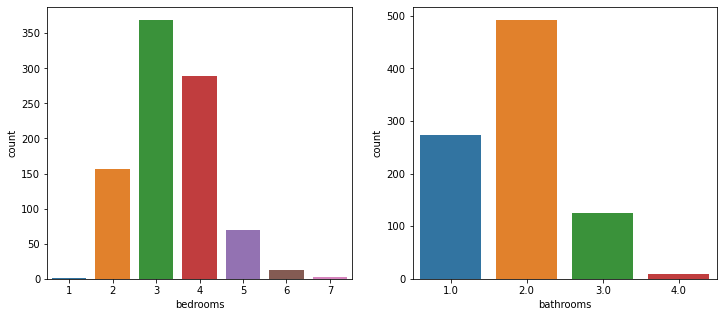

In [44]:
fig, ax =plt.subplots(1,2, figsize=(12,5))
sns.countplot(df['bedrooms'], ax=ax[0])
sns.countplot(df['bathrooms'], ax=ax[1])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0, 0, 'End of Terrace'),
 Text(1, 0, 'Semi-Detached'),
 Text(2, 0, 'Penthouse'),
 Text(3, 0, 'Detached'),
 Text(4, 0, 'Apartment'),
 Text(5, 0, 'Terraced'),
 Text(6, 0, 'House'),
 Text(7, 0, 'Flat'),
 Text(8, 0, 'Town House'),
 Text(9, 0, 'Detached Villa'),
 Text(10, 0, 'Cottage'),
 Text(11, 0, 'Link Detached House'),
 Text(12, 0, 'Barn Conversion'),
 Text(13, 0, 'Maisonette'),
 Text(14, 0, 'Mews'),
 Text(15, 0, 'Duplex'),
 Text(16, 0, 'Character Property'),
 Text(17, 0, 'Ground Flat'),
 Text(18, 0, 'Semi-detached Villa'),
 Text(19, 0, 'Chalet'),
 Text(20, 0, 'Villa')]

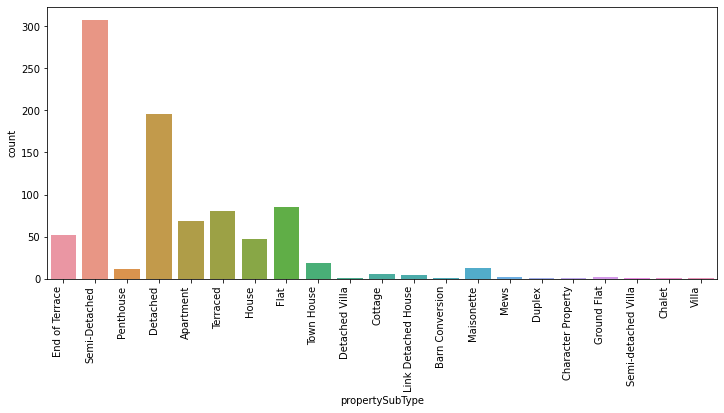

In [45]:
fig, ax =plt.subplots(1 ,figsize=(12,5))
sns.countplot(df['propertySubType'], ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")

In [46]:
df.dtypes

id                   int64
bedrooms             int64
bathrooms          float64
propertySubType     object
latitude           float64
longitude          float64
Price                int64
Specials            object
Price/Bedroom      float64
Postcode            object
City                object
London              object
dtype: object

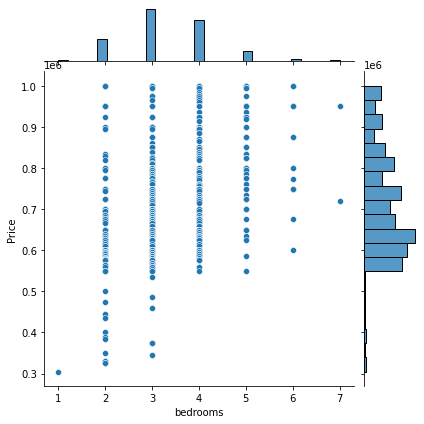

In [47]:
sns.jointplot(x='bedrooms', y='Price', data=df[['bedrooms','Price']])

<AxesSubplot:xlabel='bedrooms', ylabel='Price'>

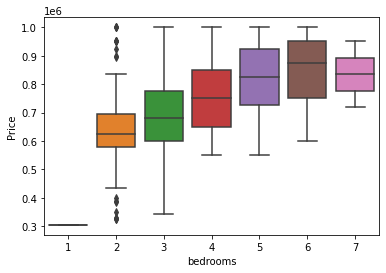

In [48]:
sns.boxplot(x='bedrooms', y='Price', data=df)

<AxesSubplot:xlabel='bedrooms', ylabel='Price/Bedroom'>

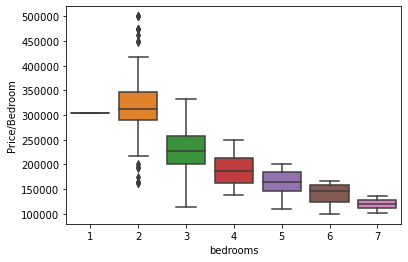

In [49]:
sns.boxplot(x='bedrooms', y='Price/Bedroom', data=df)

In [50]:
x_order = ["KT1", "KT2", "KT3", "KT4", "KT5", "KT6", "KT7", "KT8", "KT9", "KT10", "KT11", "KT12", "KT13", "KT14", "KT15", "KT16", "TK17", "KT18", "KT19", "KT20", "KT21", "KT22", "KT23", "KT24"]

In [51]:
median_order = df.groupby("Postcode")["Price"].median().sort_values(ascending=False).index.values

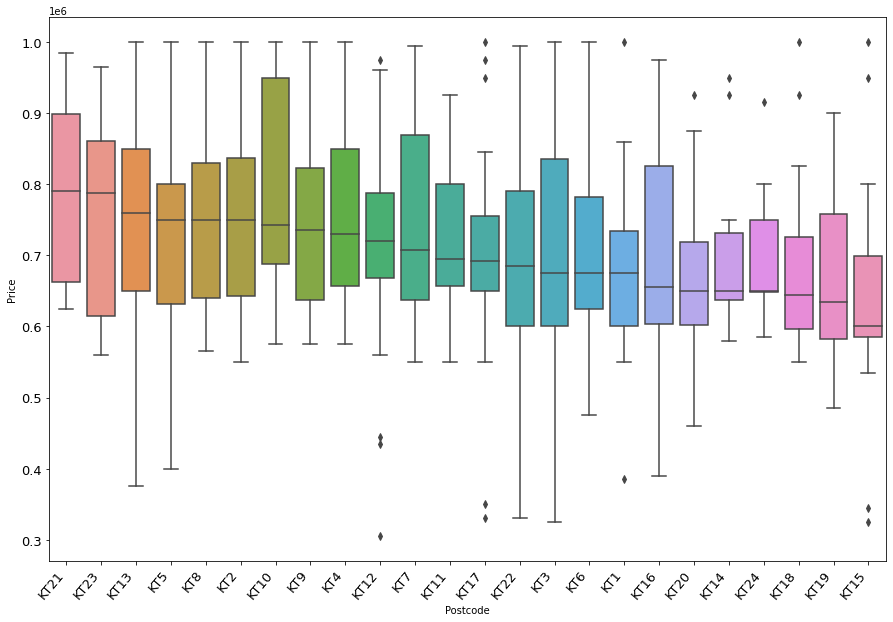

In [52]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='Postcode', y='Price', data=df, order = median_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=50, ha="right")
ax.tick_params(labelsize=13)

In [53]:
median_order = df.groupby("Postcode")["Price/Bedroom"].median().sort_values(ascending=False).index.values

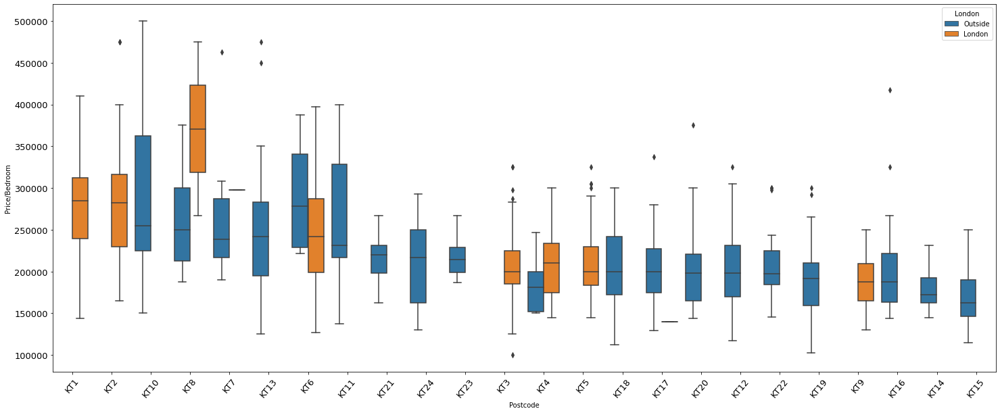

In [54]:
plt.figure(figsize=(25,10))
ax = sns.boxplot(x='Postcode', y='Price/Bedroom', data=df, order = median_order, hue="London")
ax.set_xticklabels(ax.get_xticklabels(), rotation=50)
#x.set_xticklabels(ax.get_xticklabels(), rotation=50, ha="right")
ax.tick_params(labelsize=13)

In [55]:
df.groupby(["Postcode", "London"]).agg({"London": "count"})

,,London
Postcode,London,
KT1,London,56
KT10,Outside,28
KT11,Outside,23
KT12,Outside,64
KT13,Outside,61
KT14,Outside,12
KT15,Outside,25
KT16,Outside,30
KT17,London,1


### Visualise on Maps

In [56]:
df.head()

,id,bedrooms,bathrooms,propertySubType,latitude,longitude,Price,Specials,Price/Bedroom,Postcode,City,London
0,89682484,3,2.0,End of Terrace,51.341995,-0.289841,485000,Video Tour,161667.0,KT19,Epsom and Ewell,Outside
1,102490706,4,2.0,Semi-Detached,51.395417,-0.285568,1000000,Video Tour,250000.0,KT5,London,London
2,72967107,2,2.0,Penthouse,51.363893,-0.363708,1000000,,500000.0,KT10,Esher,Outside
5,77571384,5,3.0,Semi-Detached,51.376815,-0.262222,1000000,,200000.0,KT4,Epsom and Ewell,Outside
6,78770091,4,2.0,Detached,51.314486,-0.237352,1000000,Generous Garden,250000.0,KT18,Reigate and Banstead,Outside


In [57]:
print('The dataframe has {} postcodes and {} properties.'.format(
        len(df['Postcode'].unique()),
        df.shape[0]
    )
)

The dataframe has 24 postcodes and 900 properties.


Use geopy library to get the latitude and longitude values of New York City.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent ny_explorer, as shown below.

Kingston upon Thames postcode area

In [58]:
address = 'Kingston upon Thames postcode area'

geolocator = Nominatim(user_agent="Eng_explorer")
location = geolocator.geocode(address)
Eng_latitude = location.latitude
Eng_longitude = location.longitude
print('The geograpical coordinate of Kingston upon Thames postcode area are {}, {}.'.format(Eng_latitude, Eng_longitude))

The geograpical coordinate of Kingston upon Thames postcode area are 51.41523015, -0.26122977870374237.


#### Create a map of South West England with neighborhoods superimposed on top.

In [ ]:
# create map of KT area using latitude and longitude values
map_SWENG = folium.Map(location=[Eng_latitude, Eng_longitude], zoom_start=10)

# add markers to map
for lat, lng, postcode, City in zip(df['latitude'], df['longitude'], df['Postcode'], df['City']):
    label = '{}, {}'.format(df, City)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_SWENG)  
    
map_SWENG

#### Create a map of South West England with neighborhoods superimposed on top based on price/bedroom

In [60]:
mean_per_postcode = df.groupby('Postcode').mean().reset_index()
mean_per_postcode.head()

,Postcode,id,bedrooms,bathrooms,latitude,longitude,Price,Price/Bedroom
0,KT1,8.676449e+07,2.589286,1.607143,51.406887,-0.299721,677738.982143,273339.803571
1,KT10,8.600841e+07,2.892857,1.892857,51.365009,-0.352868,781603.500000,294894.785714
2,KT11,9.052692e+07,2.956522,2.043478,51.327049,-0.390609,732956.521739,265355.130435
3,KT12,8.985743e+07,3.656250,2.062500,51.376894,-0.410368,716871.875000,203233.578125
4,KT13,9.039533e+07,3.229508,2.000000,51.368446,-0.447215,754323.770492,244017.852459


In [61]:
len(mean_per_postcode)

24

In [62]:

with open('KT.geojson') as json_data:
    location_data = json.load(json_data)

In [63]:
location_data['features'] = location_data['features'][:24]

In [64]:
for idx in range(len(location_data['features'])):
    location_data['features'][idx]['properties']['name'] = location_data['features'][idx]['properties']['name']

In [65]:
location_data

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-0.3076, 51.41422],
      [-0.30829, 51.41504],
      [-0.30774, 51.41566],
      [-0.30784, 51.41609],
      [-0.30739, 51.41716],
      [-0.30981, 51.4172],
      [-0.30984, 51.41722],
      [-0.30978, 51.41778],
      [-0.31018, 51.41867],
      [-0.31025, 51.41868],
      [-0.3115, 51.4178],
      [-0.31239, 51.41798],
      [-0.31259, 51.41816],
      [-0.31362, 51.41826],
      [-0.31384, 51.41817],
      [-0.31523, 51.41822],
      [-0.31568, 51.41838],
      [-0.3164, 51.41737],
      [-0.31609, 51.41713],
      [-0.31654, 51.41654],
      [-0.31687, 51.41648],
      [-0.31714, 51.41628],
      [-0.31719, 51.41627],
      [-0.31801, 51.41597],
      [-0.31811, 51.41602],
      [-0.32069, 51.41605],
      [-0.32221, 51.41593],
      [-0.32327, 51.41552],
      [-0.32497, 51.41459],
      [-0.32496, 51.41288],
      [-0.32594, 51.41144],
      [-0.32374, 51.409

In [66]:
#Get Lat and long for each postcode
latitude = np.zeros(df_KT.shape[0])
longitude = np.zeros(df_KT.shape[0])

geolocator = Nominatim(user_agent="KT_explorer")

for idx in range(df_KT.shape[0]):
    address = df_KT['Postcode district'].loc[idx] + ', England'
    
    location = geolocator.geocode(address)
    latitude[idx] = location.latitude
    longitude[idx] = location.longitude
    
    

In [67]:

district_coordinates = df_KT
district_coordinates['Latitude'] = latitude
district_coordinates['Longitude'] = longitude
district_coordinates

,Postcode district,Post town,Latitude,Longitude
0,KT1,KINGSTON UPON THAMES,51.404454,-0.308958
1,KT2,KINGSTON UPON THAMES,51.417294,-0.255650
2,KT3,NEW MALDEN,51.397777,-0.248322
3,KT4,WORCESTER PARK,51.374435,-0.233945
4,KT5,SURBITON,51.392597,-0.282596
5,KT6,SURBITON,51.391371,-0.307512
6,KT7,THAMES DITTON,51.392122,-0.330609
7,KT8,EAST MOLESEY; WEST MOLESEY,51.403787,-0.356884
8,KT9,CHESSINGTON,51.340349,-0.318795
9,KT10,ESHER,51.374433,-0.362035


In [68]:
len(district_coordinates)

24

In [ ]:
# vienna_geo = r'BEZIRKSGRENZEOGD.json' # geojson file
Eng_geo = location_data

# create map of KT area using latitude and longitude values
map_SWENG = folium.Map(location=[Eng_latitude, Eng_longitude], zoom_start=10)

# add the data
map_SWENG.choropleth(
    geo_data=location_data,
    data=mean_per_postcode,
    columns=['Postcode', 'Price/Bedroom'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average price/m2 for each district in KT Area'
)

# add markers to map
for lat, lng, postcode , City in zip(district_coordinates['Latitude'], district_coordinates['Longitude'], district_coordinates['Postcode district'], district_coordinates['Post town']):
    label = '{}. {}'.format(postcode, City)
    label = folium.Popup(label, parse_html=True)
    folium.Circle(
        [lat, lng],
        radius=100,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_SWENG) 

# display map
map_SWENG

### Foursquare Data

In [70]:
CLIENT_ID = 'EXKF2ISKNCWGEUGSSXULKLAE4RCSJEMNNVLUWPUDKV3PGQVJ' # your Foursquare ID
CLIENT_SECRET = 'K2AD35CYM5FRMMVOV5THFIITOVUCP0AYZDMHWT0PDTHK2P4K' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 150 # A default Foursquare API limit value
radius=1000

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: EXKF2ISKNCWGEUGSSXULKLAE4RCSJEMNNVLUWPUDKV3PGQVJ
CLIENT_SECRET:K2AD35CYM5FRMMVOV5THFIITOVUCP0AYZDMHWT0PDTHK2P4K


In [71]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [72]:
KT_venues = getNearbyVenues(names=district_coordinates['Postcode district'],
                                   latitudes=district_coordinates['Latitude'],
                                   longitudes=district_coordinates['Longitude']
                                  )

KT1
KT2
KT3
KT4
KT5
KT6
KT7
KT8
KT9
KT10
KT11
KT12
KT13
KT14
KT15
KT16
KT17
KT18
KT19
KT20
KT21
KT22
KT23
KT24


In [73]:
KT_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,KT1,51.404454,-0.308958,Riverside Cafe,51.403160,-0.307979,Café
1,KT1,51.404454,-0.308958,Stein's,51.407100,-0.307940,German Restaurant
2,KT1,51.404454,-0.308958,The Ram,51.408149,-0.307768,Pub
3,KT1,51.404454,-0.308958,Gourmet Burger Kitchen,51.407780,-0.307843,Burger Joint
4,KT1,51.404454,-0.308958,Queens Promenade,51.401082,-0.308335,Park


In [74]:
KT_venues.shape

(192, 7)

In [75]:
KT_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
KT1,25,25,25,25,25,25
KT10,14,14,14,14,14,14
KT11,1,1,1,1,1,1
KT12,1,1,1,1,1,1
KT13,4,4,4,4,4,4
KT14,18,18,18,18,18,18
KT15,7,7,7,7,7,7
KT16,5,5,5,5,5,5
KT17,4,4,4,4,4,4


In [76]:
print('There are {} uniques categories.'.format(len(KT_venues['Venue Category'].unique())))

There are 85 uniques categories.


### Analyse Each Postcode

In [77]:
# one hot encoding
KT_onehot = pd.get_dummies(KT_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
KT_onehot['Neighborhood'] = KT_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [KT_onehot.columns[-1]] + list(KT_onehot.columns[:-1])
KT_onehot = KT_onehot[fixed_columns]

KT_onehot.head()

,Neighborhood,Acupuncturist,Asian Restaurant,Bakery,Bar,Beer Store,Betting Shop,Bistro,Brazilian Restaurant,Breakfast Spot,Burger Joint,Bus Stop,Café,Campground,Canal Lock,Chinese Restaurant,Clothing Store,Coffee Shop,Construction & Landscaping,Convenience Store,Cricket Ground,Deli / Bodega,Donut Shop,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store,Garden,Garden Center,Gastropub,German Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Grocery Store,Gym / Fitness Center,Gym Pool,Hardware Store,History Museum,Hookah Bar,Hotel,IT Services,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lounge,Massage Studio,Mexican Restaurant,Movie Theater,Museum,Optical Shop,Organic Grocery,Park,Pet Café,Pet Store,Pharmacy,Pizza Place,Platform,Playground,Pool,Portuguese Restaurant,Pub,Racecourse,Restaurant,River,Sandwich Place,Ski Area,Soccer Field,Sporting Goods Shop,Sports Bar,Stationery Store,Supermarket,Tea Room,Thai Restaurant,Theater,Trail,Train Station,Vegetarian / Vegan Restaurant
0,KT1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,KT1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,KT1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,KT1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,KT1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [78]:
KT_onehot.shape

(192, 86)

In [79]:
KT_grouped = KT_onehot.groupby('Neighborhood').mean().reset_index()
KT_grouped

,Neighborhood,Acupuncturist,Asian Restaurant,Bakery,Bar,Beer Store,Betting Shop,Bistro,Brazilian Restaurant,Breakfast Spot,Burger Joint,Bus Stop,Café,Campground,Canal Lock,Chinese Restaurant,Clothing Store,Coffee Shop,Construction & Landscaping,Convenience Store,Cricket Ground,Deli / Bodega,Donut Shop,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store,Garden,Garden Center,Gastropub,German Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Grocery Store,Gym / Fitness Center,Gym Pool,Hardware Store,History Museum,Hookah Bar,Hotel,IT Services,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lounge,Massage Studio,Mexican Restaurant,Movie Theater,Museum,Optical Shop,Organic Grocery,Park,Pet Café,Pet Store,Pharmacy,Pizza Place,Platform,Playground,Pool,Portuguese Restaurant,Pub,Racecourse,Restaurant,River,Sandwich Place,Ski Area,Soccer Field,Sporting Goods Shop,Sports Bar,Stationery Store,Supermarket,Tea Room,Thai Restaurant,Theater,Trail,Train Station,Vegetarian / Vegan Restaurant
0,KT1,0.000000,0.04,0.000000,0.040000,0.0,0.000000,0.000000,0.04,0.040000,0.08,0.04,0.040000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.04,0.000000,0.000000,0.000000,0.000000,0.000000,0.04,0.000000,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.00,0.04,0.000000,0.00,0.040000,0.0,0.0,0.040000,0.000000,0.0,0.04,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.08,0.000000,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.04,0.120000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.040000,0.04,0.000000,0.000000,0.04
1,KT10,0.000000,0.00,0.000000,0.071429,0.0,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.071429,0.0,0.000000,0.071429,0.000000,0.142857,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.071429,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.071429,0.071429,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.071429,0.071429,0.000000,0.000000,0.000000,0.00,0.000000,0.071429,0.00,0.000000,0.071429,0.071429,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00
2,KT11,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00
3,KT12,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.000000,1.0,0.0,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00
4,KT13,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.500000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000

#### Let's print each neighborhood along with the top 5 most common venues


In [80]:
num_top_venues = 5

for hood in KT_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = KT_grouped[KT_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----KT1----
               venue  freq
0                Pub  0.12
1               Park  0.08
2       Burger Joint  0.08
3         Hookah Bar  0.04
4  Food & Drink Shop  0.04


----KT10----
            venue  freq
0     Coffee Shop  0.14
1   Go Kart Track  0.07
2   Movie Theater  0.07
3      Racecourse  0.07
4  Sandwich Place  0.07


----KT11----
                venue  freq
0                 Pub   1.0
1       Acupuncturist   0.0
2  Mexican Restaurant   0.0
3           Pet Store   0.0
4            Pet Café   0.0


----KT12----
                 venue  freq
0  Indie Movie Theater   1.0
1        Acupuncturist   0.0
2   Mexican Restaurant   0.0
3             Pharmacy   0.0
4            Pet Store   0.0


----KT13----
                venue  freq
0                Café  0.50
1      History Museum  0.25
2              Museum  0.25
3  Mexican Restaurant  0.00
4            Pharmacy  0.00


----KT14----
                venue  freq
0   Indian Restaurant  0.17
1  Italian Restaurant  0.11
2         Cof

Let's put that into a pandas dataframe
First, let's write a function to sort the venues in descending order.

In [81]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [82]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = KT_grouped['Neighborhood']

for ind in np.arange(KT_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(KT_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,KT1,Pub,Park,Burger Joint,Food & Drink Shop,Latin American Restaurant,Italian Restaurant,Indian Restaurant,Grocery Store,German Restaurant,Vegetarian / Vegan Restaurant
1,KT10,Coffee Shop,Movie Theater,Pizza Place,Racecourse,Café,Sandwich Place,Ski Area,Pharmacy,Go Kart Track,Bar
2,KT11,Pub,Vegetarian / Vegan Restaurant,Deli / Bodega,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant
3,KT12,Indie Movie Theater,Vegetarian / Vegan Restaurant,Garden Center,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store
4,KT13,Café,History Museum,Museum,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant


### Cluster Neighbourhood

Run k-means to cluster the neighborhood into 5 clusters.

In [94]:
# set number of clusters
kclusters = 3

KT_grouped_clustering = KT_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(KT_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:25]


unique, counts = np.unique(kmeans.labels_[0:25], return_counts=True)
dict(zip(unique, counts))

{0: 20, 1: 1, 2: 2}

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [95]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [129]:
#KT_merged = district_coordinates
KT_merged = pd.merge(district_coordinates, mean_per_postcode[["Postcode", 'Price/Bedroom']], left_on = ["Postcode district"], right_on= ['Postcode'], how = "left")

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
KT_merged = KT_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Postcode district')

KT_merged.head() # check the last columns!

,Postcode district,Post town,Latitude,Longitude,Postcode,Price/Bedroom,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,KT1,KINGSTON UPON THAMES,51.404454,-0.308958,KT1,273339.803571,0.0,Pub,Park,Burger Joint,Food & Drink Shop,Latin American Restaurant,Italian Restaurant,Indian Restaurant,Grocery Store,German Restaurant,Vegetarian / Vegan Restaurant
1,KT2,KINGSTON UPON THAMES,51.417294,-0.255650,KT2,277362.215190,0.0,Bakery,Golf Course,Vegetarian / Vegan Restaurant,Garden,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant
2,KT3,NEW MALDEN,51.397777,-0.248322,KT3,204612.663717,0.0,Korean Restaurant,Supermarket,Furniture / Home Store,Gym Pool,Pub,Donut Shop,Hardware Store,Gym / Fitness Center,Trail,Golf Course
3,KT4,WORCESTER PARK,51.374435,-0.233945,KT4,205112.309524,2.0,Pub,Bar,Supermarket,Vegetarian / Vegan Restaurant,Furniture / Home Store,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop
4,KT5,SURBITON,51.392597,-0.282596,KT5,210269.086957,0.0,Bus Stop,Park,Donut Shop,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store


In [130]:
KT_merged.drop(columns="Postcode", inplace=True)
KT_merged.head()

,Postcode district,Post town,Latitude,Longitude,Price/Bedroom,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,KT1,KINGSTON UPON THAMES,51.404454,-0.308958,273339.803571,0.0,Pub,Park,Burger Joint,Food & Drink Shop,Latin American Restaurant,Italian Restaurant,Indian Restaurant,Grocery Store,German Restaurant,Vegetarian / Vegan Restaurant
1,KT2,KINGSTON UPON THAMES,51.417294,-0.255650,277362.215190,0.0,Bakery,Golf Course,Vegetarian / Vegan Restaurant,Garden,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant
2,KT3,NEW MALDEN,51.397777,-0.248322,204612.663717,0.0,Korean Restaurant,Supermarket,Furniture / Home Store,Gym Pool,Pub,Donut Shop,Hardware Store,Gym / Fitness Center,Trail,Golf Course
3,KT4,WORCESTER PARK,51.374435,-0.233945,205112.309524,2.0,Pub,Bar,Supermarket,Vegetarian / Vegan Restaurant,Furniture / Home Store,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop
4,KT5,SURBITON,51.392597,-0.282596,210269.086957,0.0,Bus Stop,Park,Donut Shop,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store


In [131]:
KT_merged

,Postcode district,Post town,Latitude,Longitude,Price/Bedroom,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,KT1,KINGSTON UPON THAMES,51.404454,-0.308958,273339.803571,0.0,Pub,Park,Burger Joint,Food & Drink Shop,Latin American Restaurant,Italian Restaurant,Indian Restaurant,Grocery Store,German Restaurant,Vegetarian / Vegan Restaurant
1,KT2,KINGSTON UPON THAMES,51.417294,-0.255650,277362.215190,0.0,Bakery,Golf Course,Vegetarian / Vegan Restaurant,Garden,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant
2,KT3,NEW MALDEN,51.397777,-0.248322,204612.663717,0.0,Korean Restaurant,Supermarket,Furniture / Home Store,Gym Pool,Pub,Donut Shop,Hardware Store,Gym / Fitness Center,Trail,Golf Course
3,KT4,WORCESTER PARK,51.374435,-0.233945,205112.309524,2.0,Pub,Bar,Supermarket,Vegetarian / Vegan Restaurant,Furniture / Home Store,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop
4,KT5,SURBITON,51.392597,-0.282596,210269.086957,0.0,Bus Stop,Park,Donut Shop,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store
5,KT6,SURBITON,51.391371,-0.307512,243594.772152,0.0,Coffee Shop,Pub,Indian Restaurant,Platform,Italian Restaurant,Pharmacy,Grocery Store,Lounge,Deli / Bodega,Fast Food Restaurant
6,KT7,THAMES DITTON,51.392122,-0.330609,262159.125000,0.0,Pub,Gym / Fitness Center,Bakery,Indian Restaurant,Fish & Chips Shop,Clothing Store,Gastropub,Café,Vegetarian / Vegan Restaurant,Furniture / Home Store
7,KT8,EAST MOLESEY; WEST MOLESEY,51.403787,-0.356884,265735.000000,0.0,Café,Gym / Fitness Center,Grocery Store,Pub,Sandwich Place,Vegetarian / Vegan Restaurant,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant
8,KT9,CHESSINGTON,51.340349,-0.318795,188483.727273,0.0,Grocery Store,Pub,Garden Center,Restaurant,Vegetarian / Vegan Restaurant,French Restaurant,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant
9,KT10,ESHER,51.374433,-0.362035,294894.785714,0.0,Coffee Shop,Movie Theater,Pizza Place,Racecourse,Café,Sandwich Place,Ski Area,Pharmacy,Go Kart Track,Bar


In [132]:
KT_merged["Cluster Labels"].value_counts()

0.0    20
2.0     2
1.0     1
Name: Cluster Labels, dtype: int64

In [133]:
KT_merged.dropna(inplace = True)

In [134]:
KT_merged.dtypes

Postcode district          object
Post town                  object
Latitude                  float64
Longitude                 float64
Price/Bedroom             float64
Cluster Labels            float64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

In [136]:
KT_merged["Cluster Labels"] =KT_merged["Cluster Labels"].astype(int)

In [137]:
KT_merged.dtypes

Postcode district          object
Post town                  object
Latitude                  float64
Longitude                 float64
Price/Bedroom             float64
Cluster Labels              int32
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

In [ ]:
# create map
map_clusters = folium.Map(location=[Eng_latitude, Eng_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(KT_merged['Latitude'], KT_merged['Longitude'], KT_merged['Post town'], KT_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Examine Clusters

In [140]:
#Cluster 0
KT_merged.loc[KT_merged['Cluster Labels'] == 0, KT_merged.columns[[1] + list(range(5, KT_merged.shape[1]))]]

,Post town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,KINGSTON UPON THAMES,0,Pub,Park,Burger Joint,Food & Drink Shop,Latin American Restaurant,Italian Restaurant,Indian Restaurant,Grocery Store,German Restaurant,Vegetarian / Vegan Restaurant
1,KINGSTON UPON THAMES,0,Bakery,Golf Course,Vegetarian / Vegan Restaurant,Garden,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant
2,NEW MALDEN,0,Korean Restaurant,Supermarket,Furniture / Home Store,Gym Pool,Pub,Donut Shop,Hardware Store,Gym / Fitness Center,Trail,Golf Course
4,SURBITON,0,Bus Stop,Park,Donut Shop,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store
5,SURBITON,0,Coffee Shop,Pub,Indian Restaurant,Platform,Italian Restaurant,Pharmacy,Grocery Store,Lounge,Deli / Bodega,Fast Food Restaurant
6,THAMES DITTON,0,Pub,Gym / Fitness Center,Bakery,Indian Restaurant,Fish & Chips Shop,Clothing Store,Gastropub,Café,Vegetarian / Vegan Restaurant,Furniture / Home Store
7,EAST MOLESEY; WEST MOLESEY,0,Café,Gym / Fitness Center,Grocery Store,Pub,Sandwich Place,Vegetarian / Vegan Restaurant,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant
8,CHESSINGTON,0,Grocery Store,Pub,Garden Center,Restaurant,Vegetarian / Vegan Restaurant,French Restaurant,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant
9,ESHER,0,Coffee Shop,Movie Theater,Pizza Place,Racecourse,Café,Sandwich Place,Ski Area,Pharmacy,Go Kart Track,Bar
12,WEYBRIDGE,0,Café,History Museum,Museum,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant


In [141]:
#Cluster 1
KT_merged.loc[KT_merged['Cluster Labels'] == 1, KT_merged.columns[[1] + list(range(5, KT_merged.shape[1]))]]

,Post town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,WALTON-ON-THAMES,1,Indie Movie Theater,Vegetarian / Vegan Restaurant,Garden Center,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant,Furniture / Home Store


In [142]:
#Cluster 2
KT_merged.loc[KT_merged['Cluster Labels'] == 2, KT_merged.columns[[1] + list(range(5, KT_merged.shape[1]))]]

,Post town,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,WORCESTER PARK,2,Pub,Bar,Supermarket,Vegetarian / Vegan Restaurant,Furniture / Home Store,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop
10,COBHAM,2,Pub,Vegetarian / Vegan Restaurant,Deli / Bodega,English Restaurant,Entertainment Service,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food & Drink Shop,French Restaurant


In [151]:
KT_merged.reset_index(inplace=True)

In [ ]:
# vienna_geo = r'BEZIRKSGRENZEOGD.json' # geojson file
Eng_geo = location_data

# create a plain map of Vienna
map_SWENG = folium.Map(location=[Eng_latitude, Eng_longitude], zoom_start=10)

# add the data
map_SWENG.choropleth(
    geo_data=location_data,
    data=mean_per_postcode,
    columns=['Postcode', 'Price/Bedroom'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average price/m2 for each district in KT Area'
)

# add markers for e
for idx in range(len(KT_merged)):
    html_label = ''
    lat = KT_merged['Latitude'].loc[idx]
    lng = KT_merged['Longitude'].loc[idx]
    district_num = KT_merged['Postcode district'].loc[idx]
    district = KT_merged['Post town'].loc[idx]
    cluster = KT_merged['Cluster Labels'].loc[idx]
    average_price = KT_merged['Price/Bedroom'].loc[idx]
    
    if (cluster == 0):
        area = 'Residential'
    elif (cluster == 1):
        area = 'Commercial / Touristic'
    else: area = "NA"
    
    html_label = '<h4>' + str(district_num) + '. ' + district + '</h4><h5><b> Area: </b>' + '</h5><h5><b> Average Price/m2: </b>' + str(average_price.round(2)) + '€ </h5><h5><b> Top 10 Venues: </b></h5><h5><ol>'
    
#     for col in range(6, 16):
#         html_label += '<li>' + KT_merged.iloc[idx, col]

    html_label += '</ol></h5>'
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=html_label,
        color=rainbow[cluster],
        fill=True,
        fill_color="blue",
        fill_opacity=0.7).add_to(map_SWENG)

# display map
map_SWENG